In [26]:
import os, time, faiss, json, torch

import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
from io import BytesIO
import numpy as np
from torchvision import transforms as tfms

torch.manual_seed(42)

os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE" ##Without this the jupyter kernel will crash. It crashes because of too many OMP instances running, however this prevents that

## Notebook Purpose:
This notebook is just a sanity check where we load the FAISS vectorstore and verify it works as expected

In [27]:
## Some functions
def get_recommendations_dino(img, faiss_index, model, transform, k=30):
  """
  This Method takes an image, a faiss index, a model, a transform and a k value and returns the k nearest neighbors of the image in the faiss index
  """
  with torch.no_grad():
    encoded_input = model(transform(img).unsqueeze(0)).squeeze().reshape(1, -1).cpu()
    distances, indices = faiss_index.search(encoded_input, k)
    return distances, indices

In [28]:
def plot_image_matrix(n, m, test_img, metadata, indices, temp_dir_path):
    fig2 = plt.figure(figsize=(5, 4))
    plt.imshow(test_img)
    plt.axis('off')
    plt.title('Test Image')
    plt.show()
    
    fig, axes = plt.subplots(m, n, figsize=(10, 8))
    for i in range(m):
        for j in range(n):
            match_img = str(metadata[str(indices[0][i * n + j])]['image_id']) + '.jpg'
            img = Image.open(os.path.join(temp_dir_path, match_img)).resize((224, 224))
            axes[i, j].imshow(img)
            axes[i, j].set_title("Match " + str(i * n + j))
            axes[i, j].axis('off')

    plt.tight_layout()
    plt.show()


Load FAISS 

In [29]:
# index = faiss.read_index("../data/image_index_vit.index")
index = faiss.read_index("../data/image_index_vit_cs.index")

Test and get same results as EDA NB

In [30]:
# Load the pre-trained ViT model
model = torch.hub.load('facebookresearch/dino:main', 'dino_vits16')

# Define preprocessing pipeline for images
transform = tfms.Compose([
    tfms.Resize(256),
    tfms.CenterCrop(224),
    tfms.ToTensor(),
    tfms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

Using cache found in C:\Users\wolfg/.cache\torch\hub\facebookresearch_dino_main


In [31]:
metadata_file = '../data/metadata.json'

with open(metadata_file, 'r') as f:
    metadata = json.load(f)

Index: <faiss.swigfaiss_avx2.IndexIDMap; proxy of <Swig Object of type 'faiss::IndexIDMapTemplate< faiss::Index > *' at 0x000001E0699E3AB0> > Runtime: 0.054120540618896484 seconds for retrieving recommendations


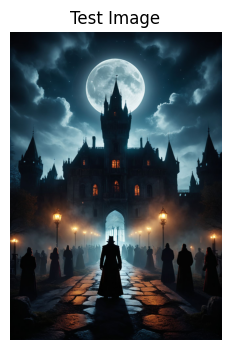

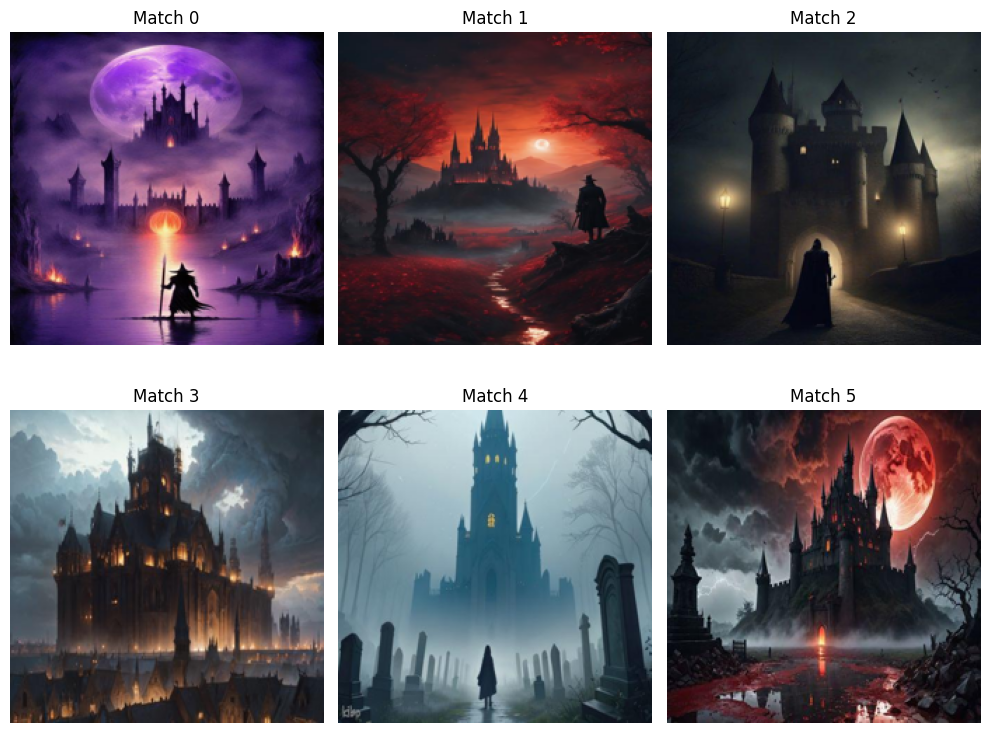

Index: <faiss.swigfaiss_avx2.IndexIDMap; proxy of <Swig Object of type 'faiss::IndexIDMapTemplate< faiss::Index > *' at 0x000001E0699E3AB0> > Runtime: 0.042368412017822266 seconds for retrieving recommendations


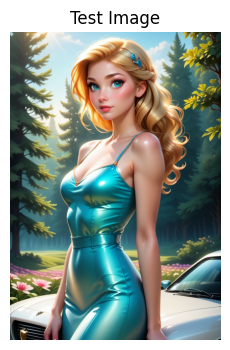

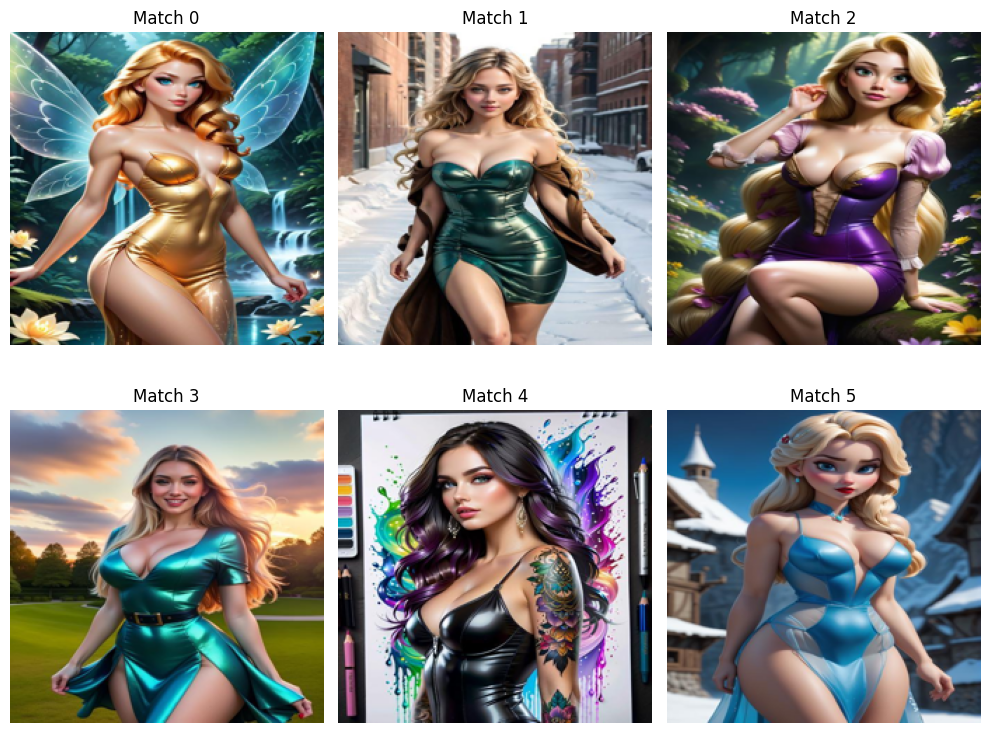

In [32]:
# Start the timer
testData = '../data/test_images/'

# Code to be measured
# ...

for ind, i in enumerate(os.listdir(testData)):
    if ind > 1:
        break
    start_time = time.time()

    test_img_path = os.path.join(testData, i)
    test_img = Image.open(test_img_path)

    distances, indices = get_recommendations_dino(test_img, index, model, transform, 30)
    # End the timer
    end_time = time.time()

    # Calculate the runtime
    runtime = end_time - start_time

    # Print the runtime
    print(f"Index: {index} Runtime: {runtime} seconds for retrieving recommendations")
    plot_image_matrix(3, 2, test_img,  metadata, indices, '../data/imgs/')

In [33]:
del index

## Compare original method
1. Our newer index (above) is more similar to Cosine and our original method (below) is more similar to euclidian distance

In [34]:
index = faiss.read_index("../data/image_index_vit.index")

Index: <faiss.swigfaiss_avx2.IndexIDMap; proxy of <Swig Object of type 'faiss::IndexIDMapTemplate< faiss::Index > *' at 0x000001DF05ADE2E0> > Runtime: 0.048998117446899414 seconds for retrieving recommendations


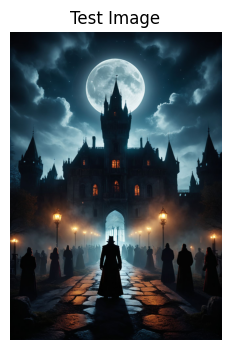

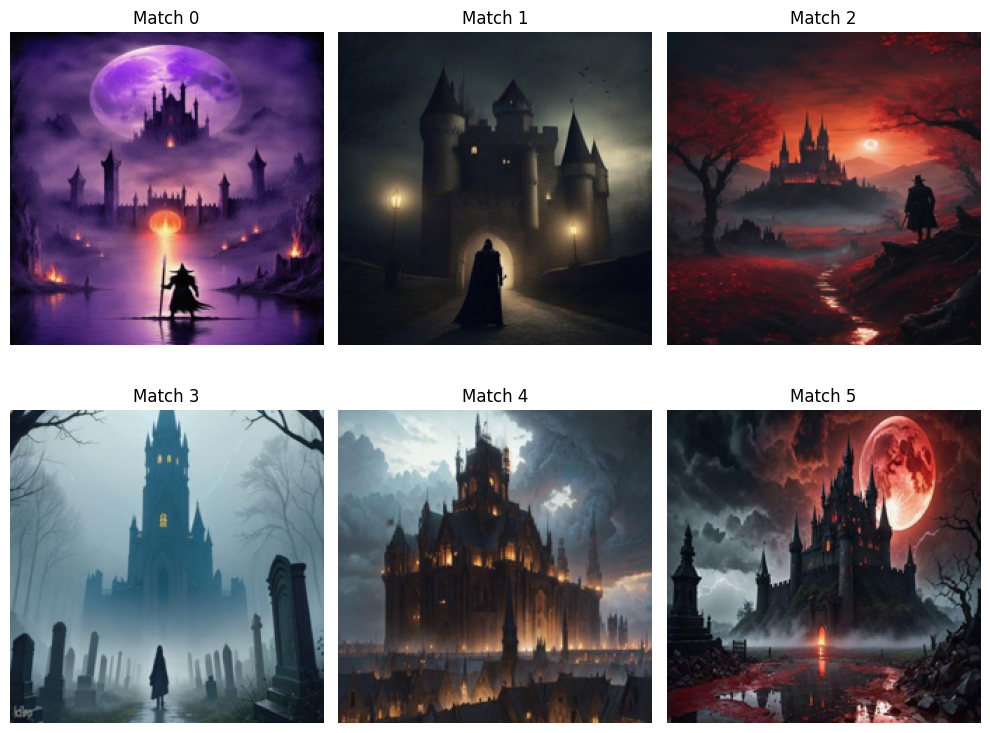

Index: <faiss.swigfaiss_avx2.IndexIDMap; proxy of <Swig Object of type 'faiss::IndexIDMapTemplate< faiss::Index > *' at 0x000001DF05ADE2E0> > Runtime: 0.04450631141662598 seconds for retrieving recommendations


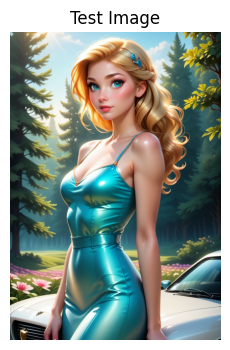

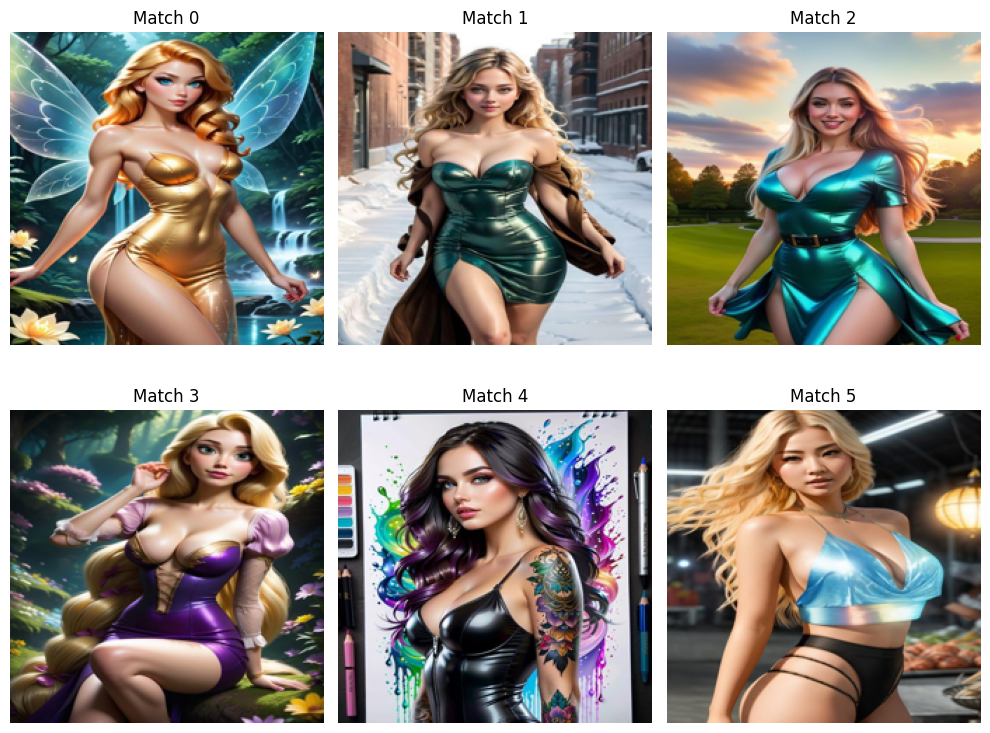

In [35]:
# Start the timer
testData = '../data/test_images/'

# Code to be measured
# ...

for ind, i in enumerate(os.listdir(testData)):
    if ind > 1:
        break
    start_time = time.time()

    test_img_path = os.path.join(testData, i)
    test_img = Image.open(test_img_path)

    distances, indices = get_recommendations_dino(test_img, index, model, transform, 30)
    # End the timer
    end_time = time.time()

    # Calculate the runtime
    runtime = end_time - start_time

    # Print the runtime
    print(f"Index: {index} Runtime: {runtime} seconds for retrieving recommendations")
    plot_image_matrix(3, 2, test_img,  metadata, indices, '../data/imgs/')

In [36]:
del index

## Compare original method vs MLP Non-linear scaled embeddings
Our original index (above) has an embedding size of 384 (Same as the cs method), while this method (below) has 512 embedings. It also has nonlinaerities introduce which causes terrible performance... 

In [37]:
index = faiss.read_index("../data/image_index_vit_512_embeddings_3layermlp_cs.index")


In [38]:
from transformers import AutoImageProcessor, AutoModel
import torch.nn as nn
processor = AutoImageProcessor.from_pretrained('facebook/dinov2-base')
model = AutoModel.from_pretrained('facebook/dinov2-base')

c:\Users\wolfg\OneDrive\Documents\CivitAI\Project Work\ViTImageRecommender\venv\Lib\site-packages\huggingface_hub\file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


In [39]:
class MultiLayerPerceptron(nn.Module):
    def __init__(self, input_size, output_size, step_size=6, num_layers=3):
        super(MultiLayerPerceptron, self).__init__()
        layers = []
        for i in range(num_layers):
            if i == 0:
                layer_in = input_size
            else:
                layer_in = layer_out
            layer_out = output_size * step_size ** (num_layers - i)
            layers.append(nn.Linear(layer_in, layer_out))
            layers.append(nn.ReLU(inplace=True))
        # Add output layer
        layers.append(nn.Linear(layer_out, output_size))
        self.fc = nn.Sequential(*layers)

    def forward(self, x):
        x = x.view(x.size(0), -1)  # Flatten the input tensor
        x = self.fc(x)
        return x

In [40]:
input_size = 257 * 768  # Input size from your DINOv2 model output
output_size = 512       # Output size
step_size = 5           # Step size for each layer
num_layers = 2          # Number of layers
mlp_3layer_512output = MultiLayerPerceptron(input_size, output_size, step_size, num_layers)

In [41]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)
mlp_3layer_512output = mlp_3layer_512output.to(device)

In [42]:
def extract_features(img, processor, model, device = torch.device("cuda" if torch.cuda.is_available() else "cpu")):
    inputs = processor(images=img, return_tensors="pt")
    outputs = model(**inputs.to(device))
    last_hidden_states = outputs.last_hidden_state
    return last_hidden_states

def get_mlp_embeddings(mlp_model, feature_embeddings, device = torch.device("cuda" if torch.cuda.is_available() else "cpu")):
    with torch.no_grad():
        mlp_embeddings = mlp_model(feature_embeddings).to(device)
        return mlp_embeddings

In [48]:
def get_mlp_recommendations_dino(img,
    processor,
    model,
    mlp_model,
    faiss_index,
    k = 30,
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    ):
  
  feature_embeddings = extract_features(img, processor, model, device)
  encoded_input = get_mlp_embeddings(mlp_model, feature_embeddings, device)
  
  with torch.no_grad():
    
    distances, indices = faiss_index.search(encoded_input.to('cpu'), k)
    
    return distances, indices

Index: <faiss.swigfaiss_avx2.IndexIDMap; proxy of <Swig Object of type 'faiss::IndexIDMapTemplate< faiss::Index > *' at 0x000001E073E94720> > Runtime: 1.3567290306091309 seconds for retrieving recommendations


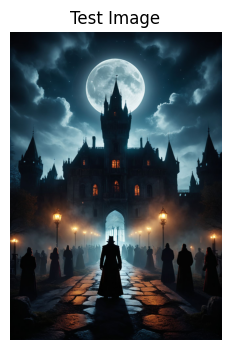

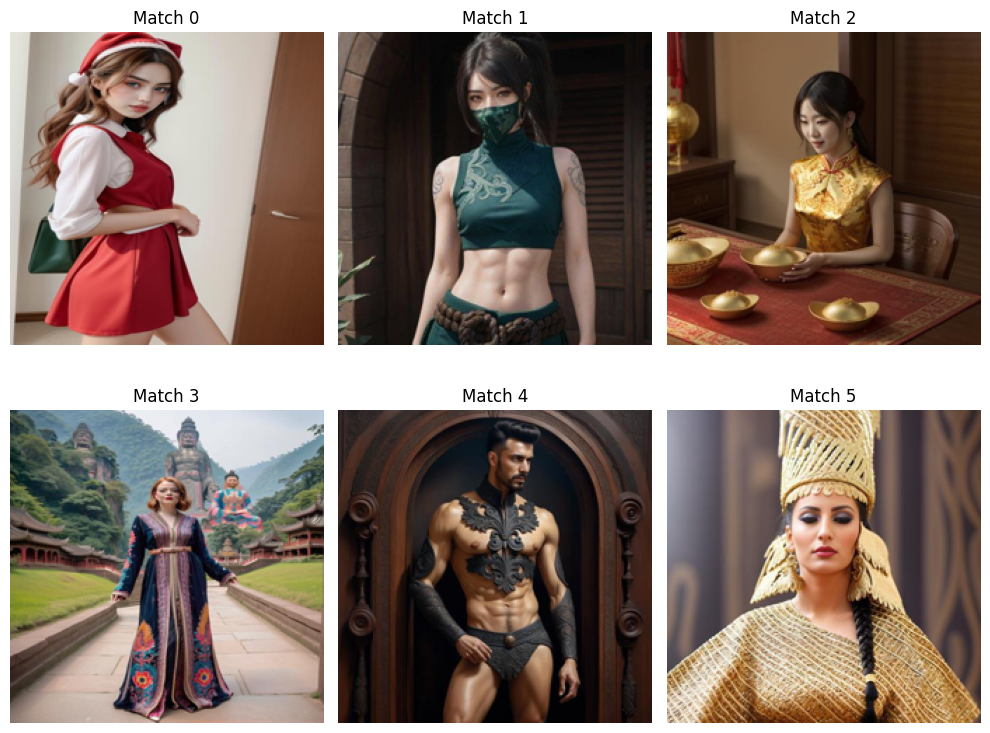

Index: <faiss.swigfaiss_avx2.IndexIDMap; proxy of <Swig Object of type 'faiss::IndexIDMapTemplate< faiss::Index > *' at 0x000001E073E94720> > Runtime: 0.9649157524108887 seconds for retrieving recommendations


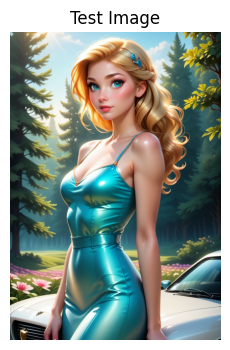

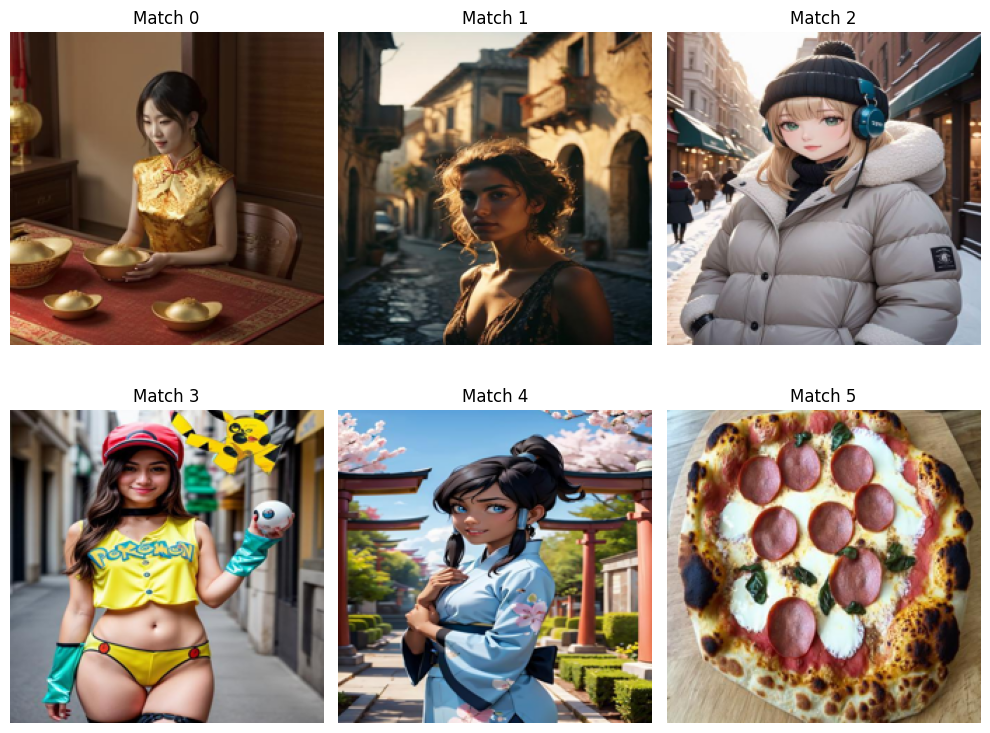

In [49]:
for ind, i in enumerate(os.listdir(testData)):
    if ind > 1:
        break
    start_time = time.time()

    test_img_path = os.path.join(testData, i)
    test_img = Image.open(test_img_path)

    distances, indices = get_mlp_recommendations_dino(test_img, processor, model, mlp_3layer_512output, index, 30, device)
    # End the timer
    end_time = time.time()

    # Calculate the runtime
    runtime = end_time - start_time

    # Print the runtime
    print(f"Index: {index} Runtime: {runtime} seconds for retrieving recommendations")
    plot_image_matrix(3, 2, test_img,  metadata, indices, '../data/imgs/')

## Compare Linear CS MLP method

In [45]:
class MultiLayerLinearPerceptron(nn.Module):
    def __init__(self, input_size, output_size, step_size=6, num_layers=3):
        super(MultiLayerLinearPerceptron, self).__init__()
        layers = []
        for i in range(num_layers):
            if i == 0:
                layer_in = input_size
            else:
                layer_in = layer_out
            layer_out = output_size * step_size ** (num_layers - i)
            layers.append(nn.Linear(layer_in, layer_out))
        # Add output layer
        layers.append(nn.Linear(layer_out, output_size))
        self.fc = nn.Sequential(*layers)

    def forward(self, x):
        x = x.view(x.size(0), -1)  # Flatten the input tensor
        x = self.fc(x)
        return x

In [46]:
mlp_3layer_no_relu_512output = MultiLayerLinearPerceptron(input_size, output_size, step_size, num_layers)
mlp_3layer_no_relu_512output = mlp_3layer_no_relu_512output.to(device)

Index: <faiss.swigfaiss_avx2.IndexIDMap; proxy of <Swig Object of type 'faiss::IndexIDMapTemplate< faiss::Index > *' at 0x000001E051850B40> > Runtime: 0.8129339218139648 seconds for retrieving recommendations


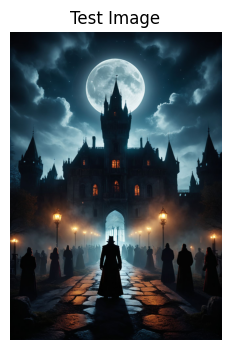

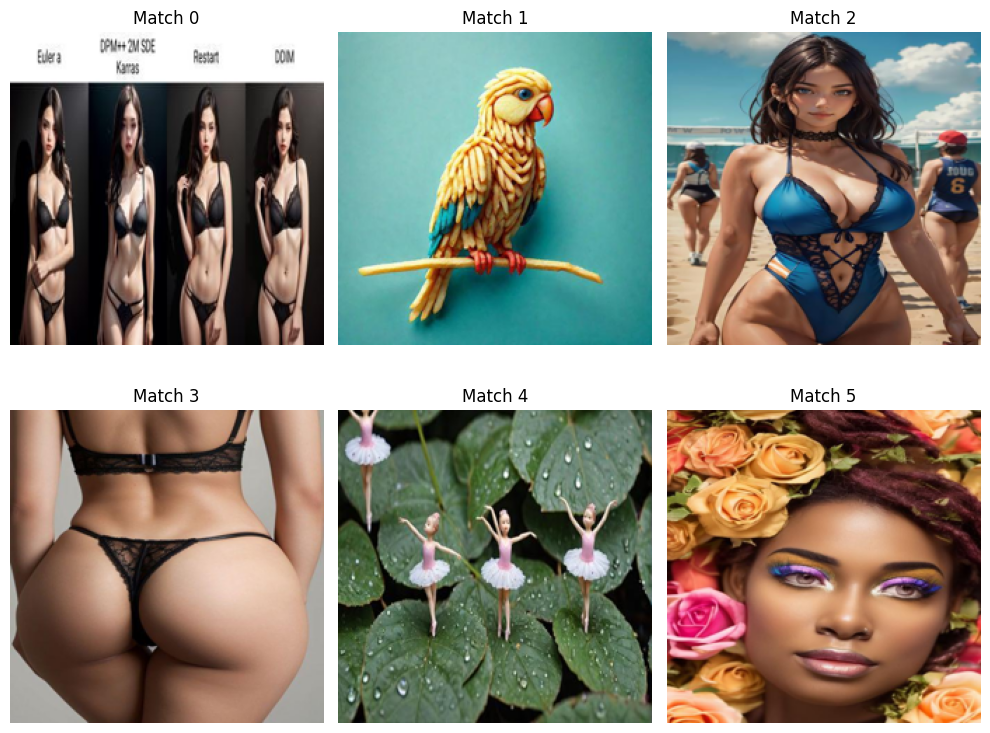

Index: <faiss.swigfaiss_avx2.IndexIDMap; proxy of <Swig Object of type 'faiss::IndexIDMapTemplate< faiss::Index > *' at 0x000001E051850B40> > Runtime: 0.7063758373260498 seconds for retrieving recommendations


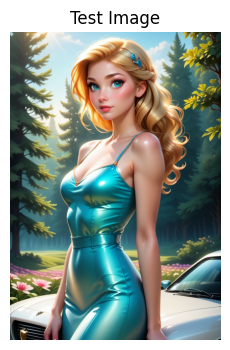

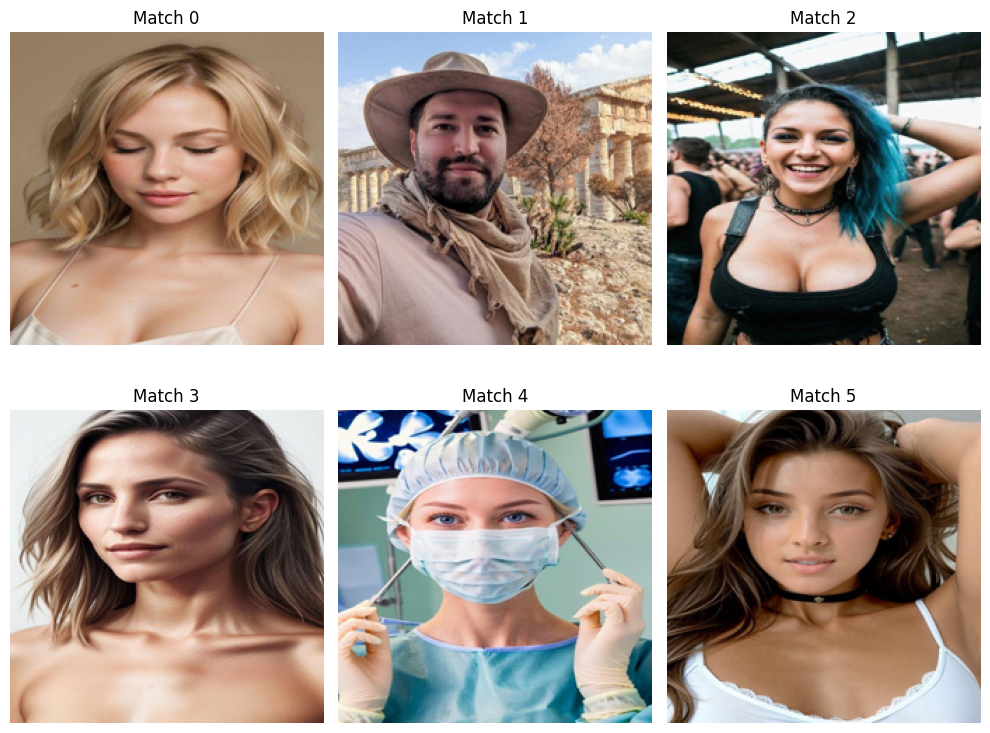

In [50]:
index = faiss.read_index("../data/image_index_vit_512_embeddings_3layermlp_noRelu_cs.index")
# Start the timer
testData = '../data/test_images/'

# Code to be measured
# ...

for ind, i in enumerate(os.listdir(testData)):
    if ind > 1:
        break
    start_time = time.time()

    test_img_path = os.path.join(testData, i)
    test_img = Image.open(test_img_path)

    distances, indices = get_mlp_recommendations_dino(test_img, processor, model, mlp_3layer_no_relu_512output, index, 30, device)
    # End the timer
    end_time = time.time()

    # Calculate the runtime
    runtime = end_time - start_time

    # Print the runtime
    print(f"Index: {index} Runtime: {runtime} seconds for retrieving recommendations")
    plot_image_matrix(3, 2, test_img,  metadata, indices, '../data/imgs/')

## Takeaway

1. 384 embeddings feels small... but honestly, this works fairly well
2. There is no way to 'attach' metadata to the faiss, but both the faiss and metadata are lightweight enough to carry around
    - when we get back our distances/indices from faiss we can use the indice key to get back the correct information from the metadata dict/json
3. MAYBE MLP works alright... the main problem is we need to save the MLP network at the time its created so we can use the exact same network when we process the images
    - Performance above may not be indicative because we forgot about randomness when initializing the MLPs
    - For now, we will continue with the original index and utilize metadata filtering